# **PROJECT 1: OBJECT COUNTING**

## Connect Drive

In [1]:
from google.colab import drive
drive.mount('/content/drive')
%cd /content/drive/MyDrive/20202/Thị giác máy tính/1-7 CV Project/Computer Vision/Project1

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
/content/drive/.shortcut-targets-by-id/1mVefHy2VXF7pDg3gGs9eJZ1oeoGHEbL6/Computer Vision/Project1


##Import Libs

In [2]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

 # **Ảnh hạt gạo**

## Show sigle image function

In [3]:
def show_img(img, title = None):
    plt.figure(figsize=(10,10))
    plt.title(title)
    plt.xticks([])
    plt.yticks([])
    plt.imshow(img)

In [4]:
def graysacle(img_path):
    og_img = cv2.imread(img_path)
    gray_img = cv2.cvtColor(og_img, cv2.COLOR_BGR2GRAY)

    print('original image shape: ', og_img.shape)
    print('graysacle image shape:', gray_img.shape)

    fig, ax = plt.subplots(1,2, figsize=(15,15)) #1 row, 2 columns
    
    ax[0].set_title("original image")
    ax[0].imshow(og_img);

    ax[1].set_title("graysacle image")
    ax[1].imshow(gray_img);

    return og_img, gray_img

## Read and graysacle image function

## Put a red dot on each contour function

In [5]:
def red_dot(og_img, contours):
    dot_ = og_img.copy()
    for idx, cnt in enumerate(contours):
        x,y,w,h = cv2.boundingRect(cnt)
        # add a red dot at center contours
        cv2.circle(dot_, (x+int(w/2),y+int(h/2)), radius=0, color=(255, 0, 0), thickness=3)

        # draw rectangle contours
        # cv2.rectangle(og_img, (x, y), (x + w, y + h), (0,0,255), 2)

        # draw contours
        # cv2.drawContours(og_img, contours, -1, (0, 0, 255), 2)
        
        # put index contours
        cv2.putText(dot_, str(idx+1), (x+int(w/2) + 2, y+int(h/2) + 2), cv2.FONT_HERSHEY_SIMPLEX, 0.4, (0,255,0),1) 
    
    plt.figure(figsize = (10,10))
    plt.title("red dot")
    plt.imshow(dot_)
    print("Number detected contours", idx+1)

## Xử lý riêng biệt

###[Ảnh 1 - normal](https://medium.com/@sumandeep.banerjee/counting-grains-of-rice-corona-quarantine-blues-44eaba6d3598)

original image shape:  (461, 461, 3)
graysacle image shape: (461, 461)


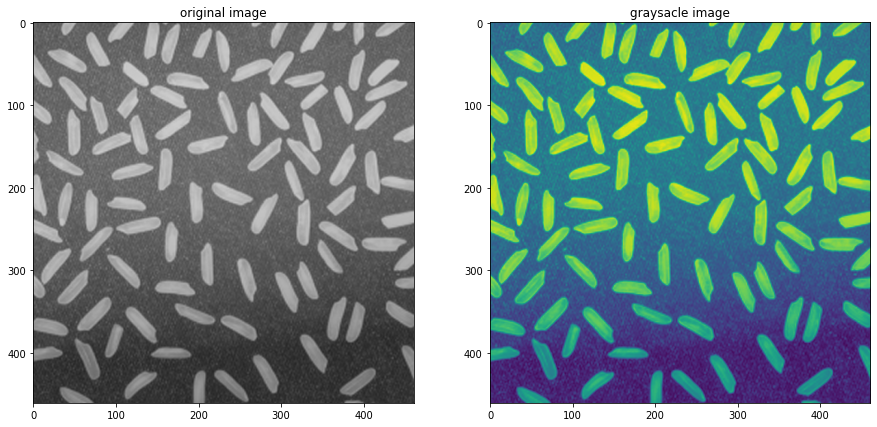

In [6]:
# graysacle image
img_path = './data/rice1.png'
og_img, gray_img = graysacle(img_path)

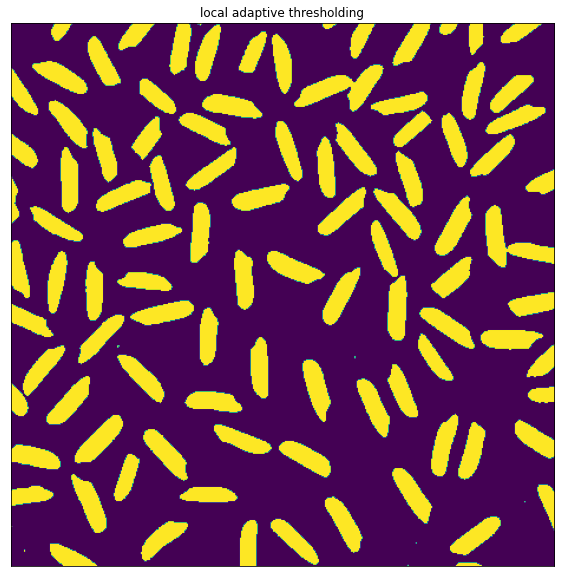

In [7]:
# local adaptive thresholding - computes local threshold based on given window size
output_adapthresh = cv2.adaptiveThreshold(gray_img, 255.0, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY, 55, -20.0)

show_img(output_adapthresh, 'local adaptive thresholding')

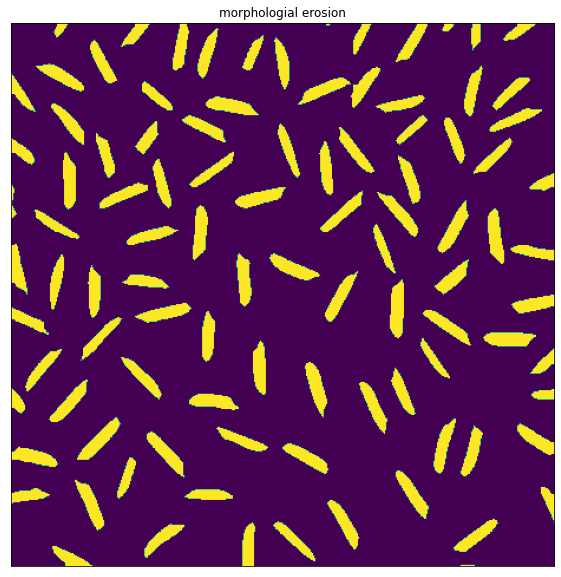

In [8]:
# morphologial erosion - cleaning up binary images
kernel = np.ones((5,5),np.uint8)
output_erosion = cv2.erode(output_adapthresh, kernel)

show_img(output_erosion, 'morphologial erosion')

Number of detected contours 100


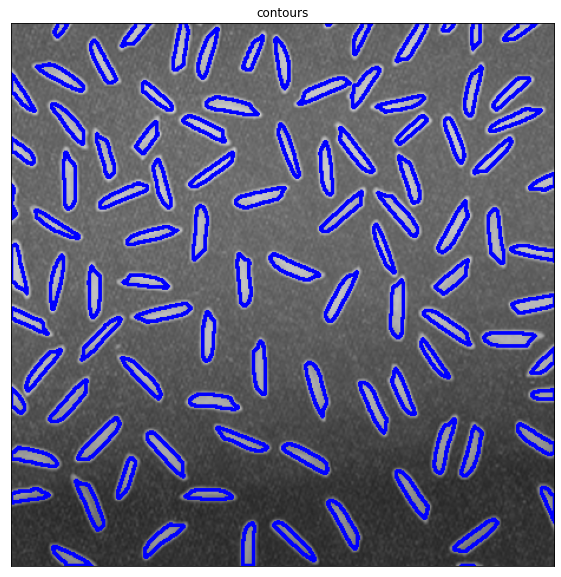

In [9]:
# contours - Computes polygonal contour boundary of foreground objects
# apply connected components on clean binary image
contours, _ = cv2.findContours(output_erosion, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
output_contour = og_img.copy()
cv2.drawContours(output_contour, contours, -1, (0, 0, 255), 2)

print('Number of detected contours', len(contours))
show_img(output_contour, 'contours')

Number detected contours 100


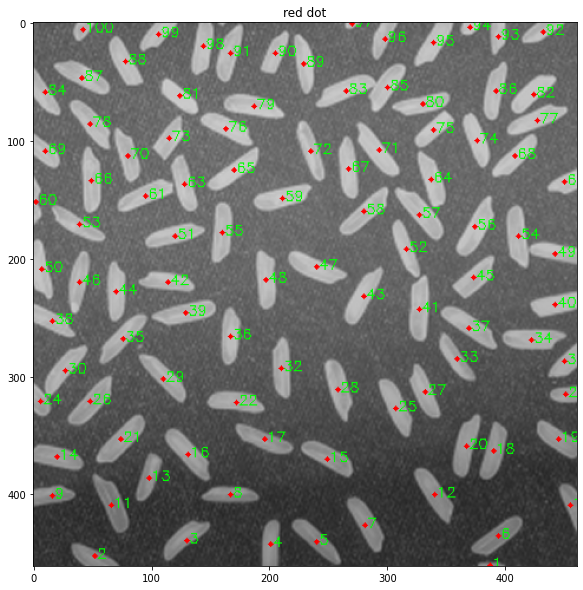

In [10]:
# red dot
red_dot(og_img, contours)

### Ảnh 2 - salt and pepper noise

original image shape:  (461, 461, 3)
graysacle image shape: (461, 461)


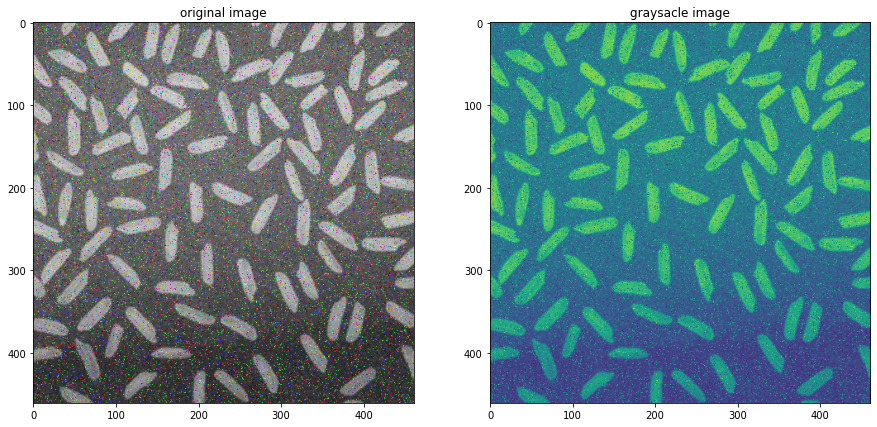

In [11]:
# graysacle image
img_path = './data/rice2.png'
og_img, gray_img = graysacle(img_path)

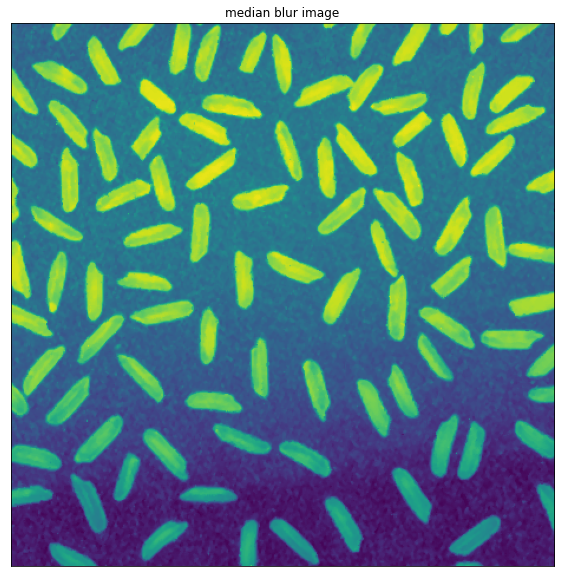

In [12]:
# median blurring
median_blur = cv2.medianBlur(gray_img,3)

show_img(median_blur, "median blur image")

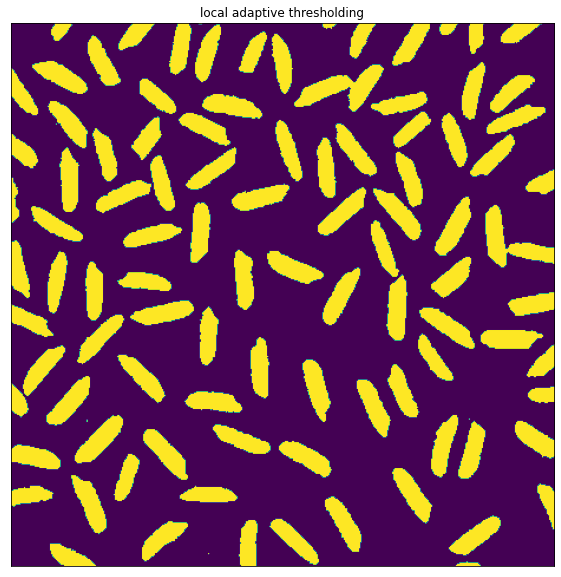

In [13]:
# local adaptive thresholding - computes local threshold based on given window size
output_adapthresh = cv2.adaptiveThreshold(median_blur, 255.0, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY, 49, -20.0)

show_img(output_adapthresh, 'local adaptive thresholding')

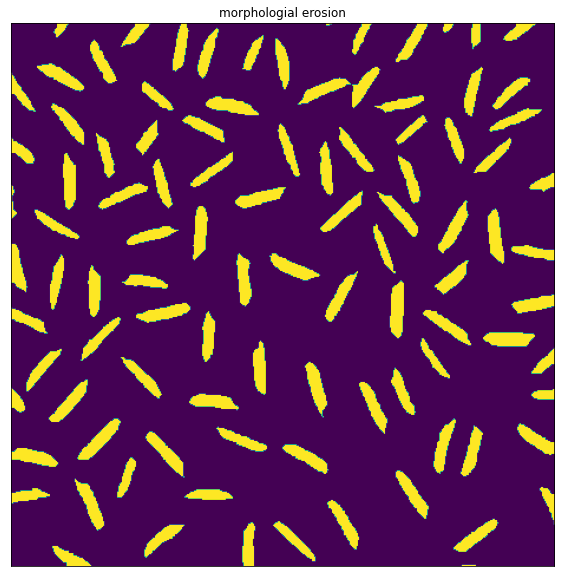

In [14]:
# morphologial erosion - cleaning up binary images
kernel = np.ones((5,5),np.uint8)

output_erosion = cv2.erode(output_adapthresh, kernel)

show_img(output_erosion, 'morphologial erosion')

Number of detected contours 100


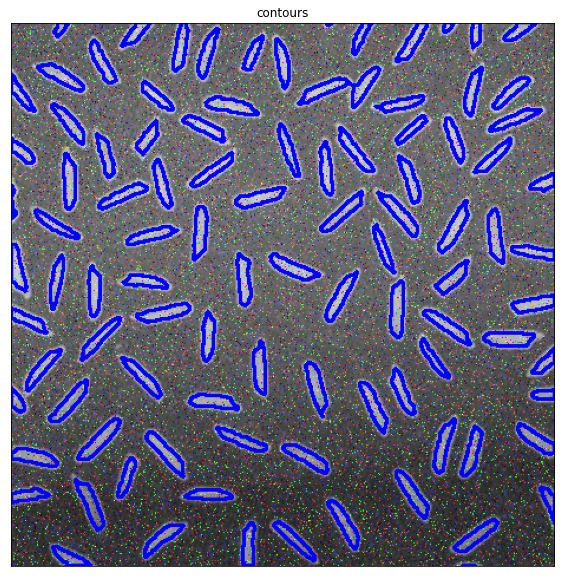

In [15]:
# contours - Computes polygonal contour boundary of foreground objects
# apply connected components on clean binary image
contours, _ = cv2.findContours(output_erosion, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
output_contour = og_img.copy()
cv2.drawContours(output_contour, contours, -1, (0, 0, 255), 2)

print('Number of detected contours', len(contours))
show_img(output_contour, 'contours')

Number detected contours 100


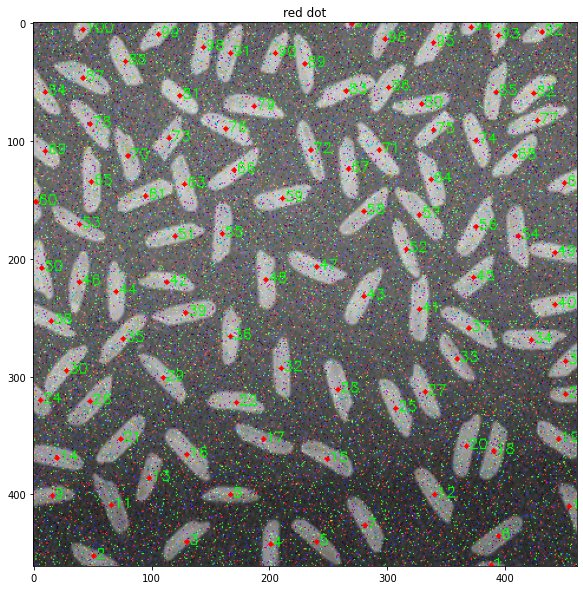

In [16]:
# red dot
red_dot(og_img, contours)

### Ảnh 3 - periodic noise

original image shape:  (461, 461, 3)
graysacle image shape: (461, 461)


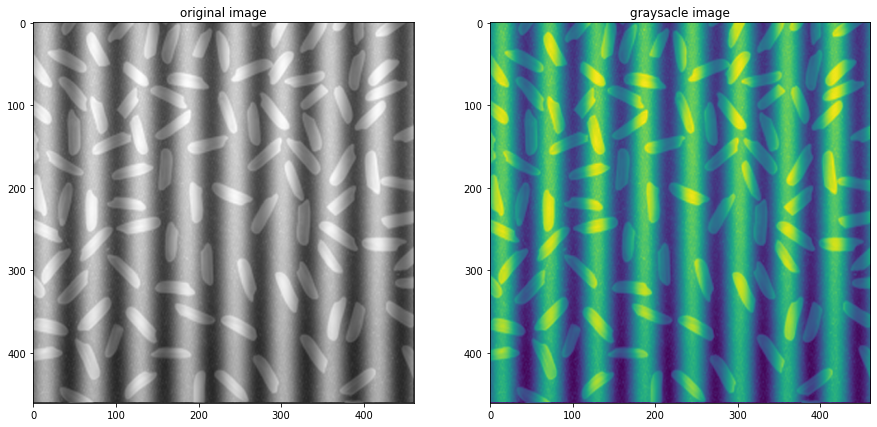

In [17]:
# graysacle image
img_path = './data/rice3.png'
og_img, gray_img = graysacle(img_path)

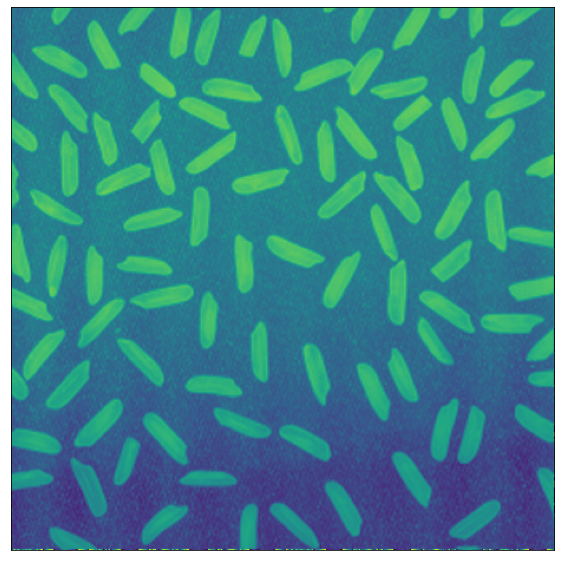

In [18]:
r=5
threshold_mag=0.8
gamma_post=0.16

# Ảnh đầu vào phải là ảnh xám
dft = cv2.dft(np.float32(gray_img),flags = cv2.DFT_COMPLEX_OUTPUT)
# Dịch tọa độ 0,0 vào giữa
dft_shift = np.fft.fftshift(dft)

# lấy độ lớn và pha
mag, phase = cv2.cartToPolar(dft_shift[:,:,0], dft_shift[:,:,1])
mag = 20*np.log(mag)
mag = mag / mag.max()
mask = (mag > threshold_mag).astype(np.uint8)

rows, cols = gray_img.shape
crow, ccol = rows//2 , cols//2
mask[crow-r:crow+r, ccol-r:ccol+r] = 0

dft_shift[mask != 0] = 0

f_ishift = np.fft.ifftshift(dft_shift) # dịch lại tọa độ 0,0 về góc trên bên trái
img_back = cv2.idft(f_ishift)
img_back = cv2.magnitude(img_back[:,:,0],img_back[:,:,1]) # ảnh sau khi đã iDFT
img_back = np.array(255*(img_back/255)**gamma_post, dtype='uint8')
img_return = img_back

show_img(img_return)

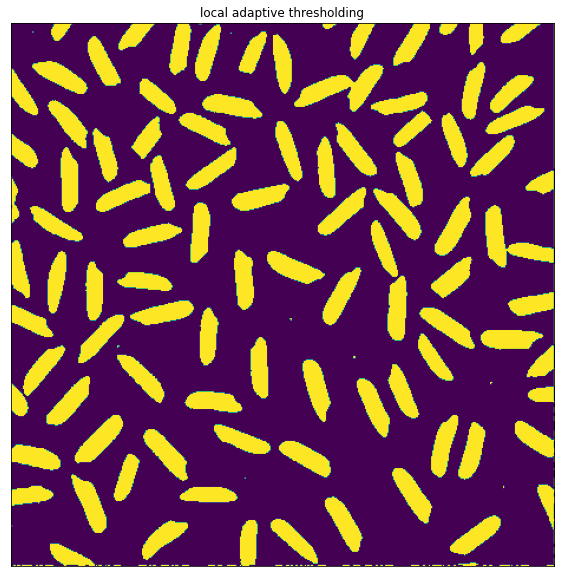

In [19]:
# local adaptive thresholding - computes local threshold based on given window size
output_adapthresh = cv2.adaptiveThreshold(img_return, 255.0, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY, 49, -20.0)

show_img(output_adapthresh, 'local adaptive thresholding')

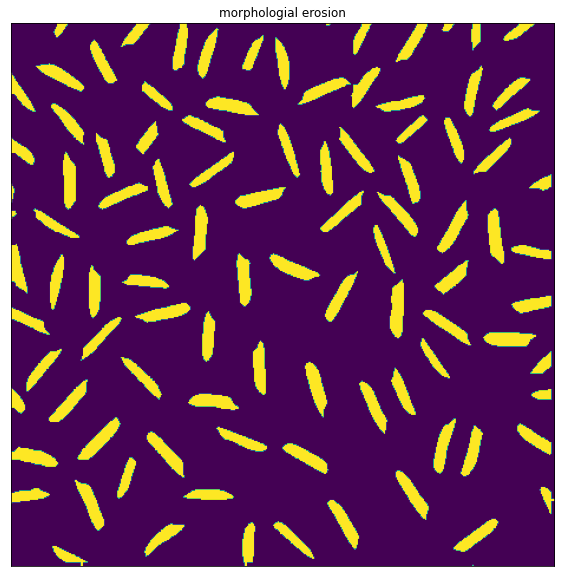

In [20]:
# morphologial erosion - cleaning up binary images
kernel = np.ones((5,5),np.uint8)

output_erosion = cv2.erode(output_adapthresh, kernel)

show_img(output_erosion, 'morphologial erosion')

Number of detected contours 101


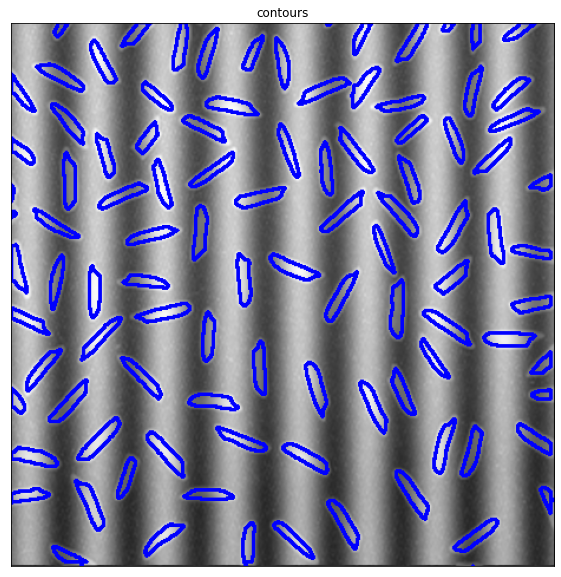

In [21]:
# contours - Computes polygonal contour boundary of foreground objects
# apply connected components on clean binary image
contours, _ = cv2.findContours(output_erosion, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
output_contour = og_img.copy()
cv2.drawContours(output_contour, contours, -1, (0, 0, 255), 2)

print('Number of detected contours', len(contours))
show_img(output_contour, 'contours')

Number detected contours 101


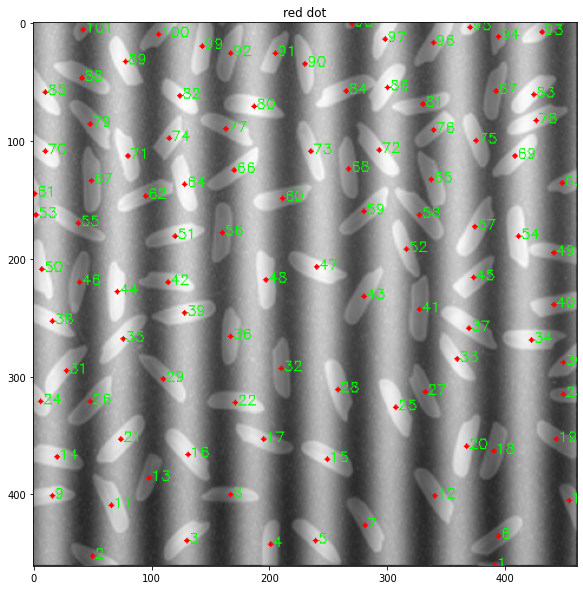

In [22]:
# red dot
red_dot(og_img, contours)

### Ảnh 4 - contrast and brightness

original image shape:  (461, 461, 3)
graysacle image shape: (461, 461)


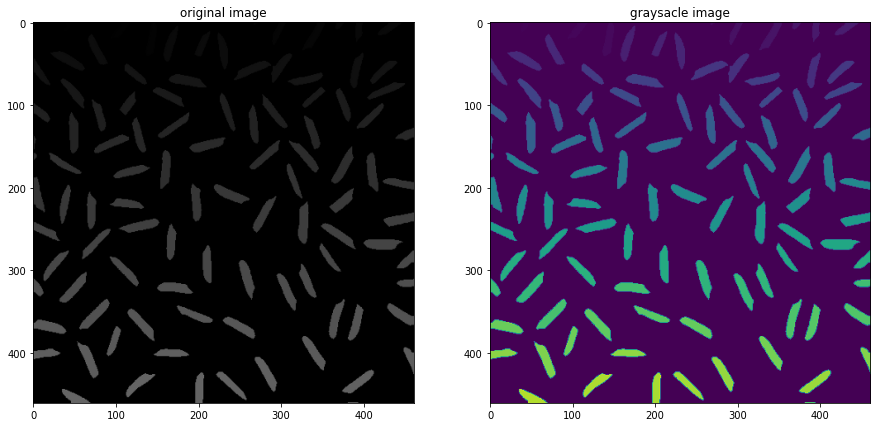

In [23]:
# graysacle image
img_path = './data/rice4.png'
og_img, gray_img = graysacle(img_path)

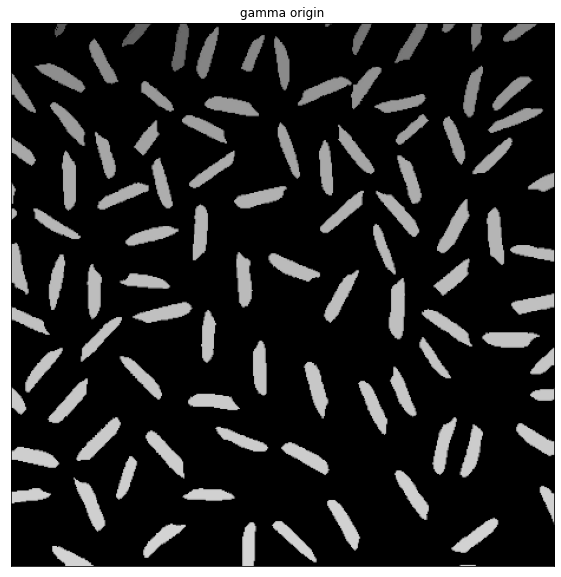

In [24]:
gamma_origin = 0.2
new_img = np.array(255*(og_img/255)**gamma_origin, dtype='uint8')
new_gray_img = cv2.cvtColor(new_img, cv2.COLOR_RGB2GRAY)

show_img(new_img, 'gamma origin')

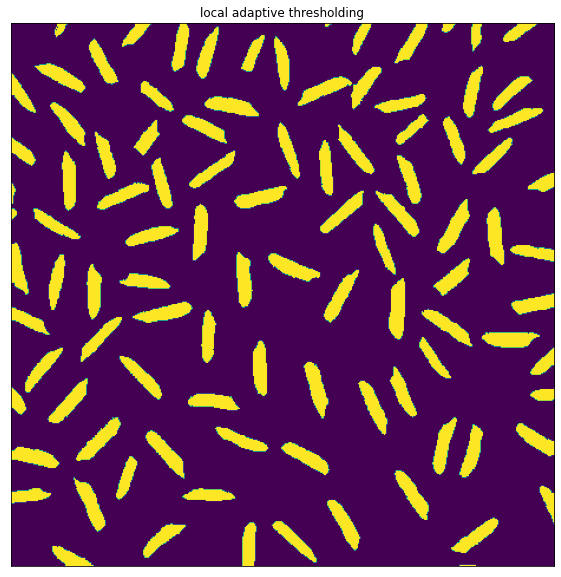

In [25]:
# local adaptive thresholding - computes local threshold based on given window size
output_adapthresh = cv2.adaptiveThreshold(new_gray_img, 255.0, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY, 49, -20.0)

show_img(output_adapthresh, 'local adaptive thresholding')

Number of detected contours 101


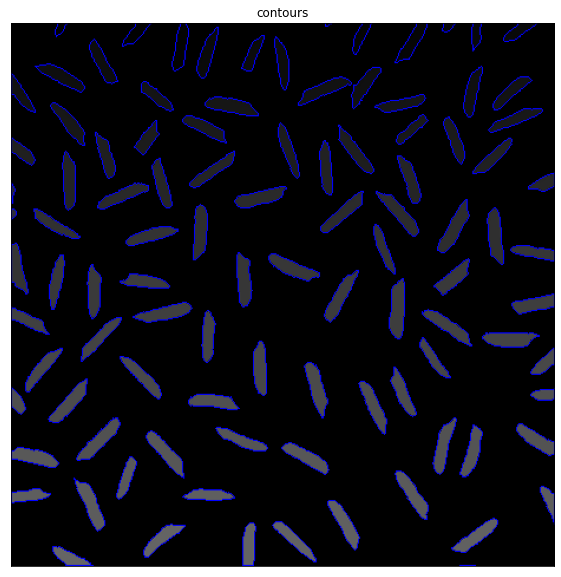

In [26]:
# contours - Computes polygonal contour boundary of foreground objects
# apply connected components on clean binary image
contours, _ = cv2.findContours(output_adapthresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
output_contour = og_img.copy()
cv2.drawContours(output_contour, contours, -1, (0, 0, 255), 1)

print('Number of detected contours', len(contours))
show_img(output_contour, 'contours')

Number detected contours 101


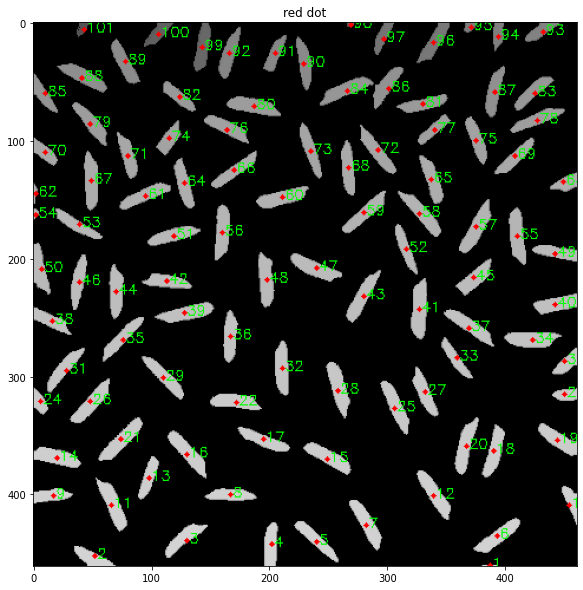

In [27]:
# red dot
red_dot(new_img, contours)

## Define function

In [28]:
# gray sacle image
def graysacle(img_path):
    og_img = cv2.imread(img_path)
    gray_img = cv2.cvtColor(og_img, cv2.COLOR_BGR2GRAY)

    return og_img, gray_img

In [29]:
# median blurring
def median_blur_img(gray_img):
    median_blur = cv2.medianBlur(gray_img,3)
    
    return median_blur

In [30]:
def remove_periodic_noise(gray_img):
    r=5
    threshold_mag=0.8
    gamma_post=0.16

    # Ảnh đầu vào phải là ảnh xám
    dft = cv2.dft(np.float32(gray_img),flags = cv2.DFT_COMPLEX_OUTPUT)
    # Dịch tọa độ 0,0 vào giữa
    dft_shift = np.fft.fftshift(dft)

    # lấy độ lớn và pha
    mag, phase = cv2.cartToPolar(dft_shift[:,:,0], dft_shift[:,:,1])
    mag = 20*np.log(mag)
    mag = mag / mag.max()
    mask = (mag > threshold_mag).astype(np.uint8)

    rows, cols = gray_img.shape
    crow, ccol = rows//2 , cols//2
    mask[crow-r:crow+r, ccol-r:ccol+r] = 0

    dft_shift[mask != 0] = 0

    f_ishift = np.fft.ifftshift(dft_shift) # dịch lại tọa độ 0,0 về góc trên bên trái
    img_back = cv2.idft(f_ishift)
    img_back = cv2.magnitude(img_back[:,:,0],img_back[:,:,1]) # ảnh sau khi đã iDFT
    img_back = np.array(255*(img_back/255)**gamma_post, dtype='uint8')

    return img_back

In [31]:
def gamma_origin(og_img):
    gamma_ = 0.2
    new_img = np.array(255*(og_img/255)**gamma_, dtype='uint8')
    new_gray_img = cv2.cvtColor(new_img, cv2.COLOR_RGB2GRAY)

    return gamma_, new_gray_img

In [32]:
# local adaptive thresholding - computes local threshold based on given window size
def LA_thresh(img, param):
    output_adapthresh = cv2.adaptiveThreshold(img, 255.0, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY, param, -20.0)
    return output_adapthresh

In [33]:
# morphologial erosion - cleaning up binary images
def erosion(output_adapthresh):
    kernel = np.ones((5,5),np.uint8)
    output_erosion = cv2.erode(output_adapthresh, kernel)

    return output_erosion

In [34]:
# contours - Computes polygonal contour boundary of foreground objects
# apply connected components on clean binary image
def draw_contour(output_erosion):
    contours, _ = cv2.findContours(output_erosion, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    output_contour = og_img.copy()
    draw_cnt = cv2.drawContours(output_contour, contours, -1, (0, 0, 255), 2)

    return contours, draw_cnt

In [35]:
# red dot
def red_dot(og_img, contours):
    dot_ = og_img.copy()
    for idx, cnt in enumerate(contours):
        x,y,w,h = cv2.boundingRect(cnt)
        # add a red dot at center contours
        cv2.circle(dot_, (x+int(w/2),y+int(h/2)), radius=0, color=(255, 0, 0), thickness=3)

        # put index contours
        cv2.putText(dot_, str(idx+1), (x+int(w/2) + 2, y+int(h/2) + 2), cv2.FONT_HERSHEY_SIMPLEX, 0.4, (0,255,0), 1) 
    
    return dot_

In [36]:
# main function
def rice_count(img_path, param, blur=0, periodic=0, gamma=0):
    og_img, gray_img = graysacle(img_path)

    img = gray_img.copy()
    tit_0 = "not processing image"

    fig, ax = plt.subplots(2,4, figsize=(30,10)) #2 row, 4 columns
    # remove the x and y ticks
    for a in ax.flat:
        a.axis('off')

    if blur == 1:
        img = median_blur_img(gray_img)
        tit_0 = "postprocessing image (median blur)"

    if periodic == 1:
        img = remove_periodic_noise(gray_img)
        tit_0 = "postpprocessing image (remove periodic noise)"
    
    if gamma == 1:
        gamma_, img = gamma_origin(og_img)
        tit_0 = "postprocessing image (gamma origin = " + str(gamma_) + ")"
        
    output_adapthresh = LA_thresh(img, param)

    if gamma == 1:
        output_erosion = output_adapthresh
        ax[1,0].set_title("not erosion image")
        
    else:
        output_erosion = erosion(output_adapthresh)
        ax[1,0].set_title("erosion image")

    contours, draw_cnt = draw_contour(output_erosion)
    dot_ = red_dot(og_img, contours)

    main_tit = "IMAGE " + str(img_path[7:]).upper()
    fig.suptitle(main_tit)
    
    ax[0,0].set_title("original image")
    ax[0,0].imshow(og_img);

    ax[0,1].set_title("graysacle image")
    ax[0,1].imshow(gray_img);

    ax[0,2].set_title(tit_0)
    ax[0,2].imshow(img);

    ax[0,3].set_title("local adapatative threshold")
    ax[0,3].imshow(output_adapthresh);

    ax[1,0].imshow(output_erosion);

    tit_1 = "contours" 
    ax[1,1].set_title(tit_1)
    ax[1,1].imshow(draw_cnt);

    tit_2 = "rice number: " + str(len(contours))
    ax[1,2].set_title(tit_2)
    ax[1,2].imshow(dot_);

    ax[-1, -1].axis('off') # do not show last axes (blank axes)

    plt.figure(figsize=(10,10))
    plt.axis('off')
    plt.title(tit_2)
    plt.imshow(dot_)

## Kết quả

### Ảnh 1: chuẩn

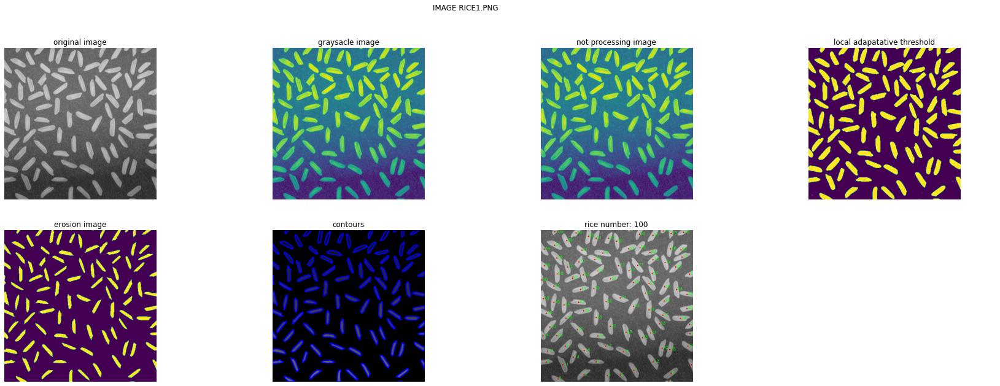

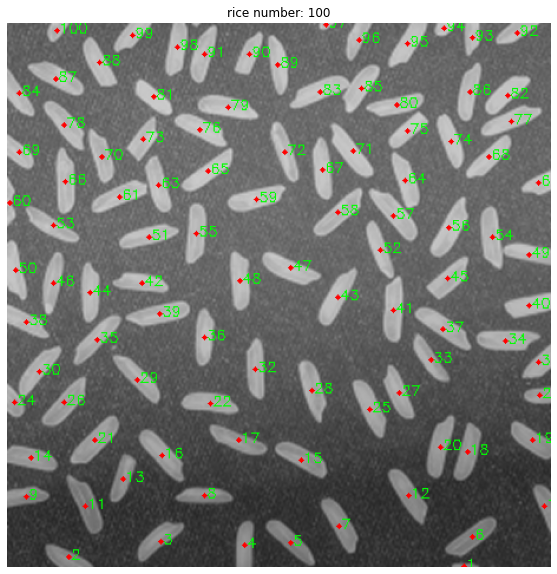

In [37]:
img_path = './data/rice1.png'
rice_count(img_path, 55, 0, 0, 0)

### Ảnh 2: chuẩn

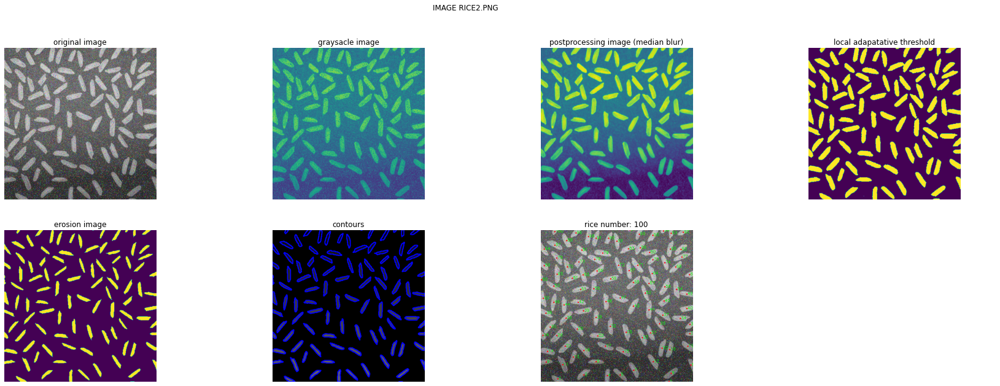

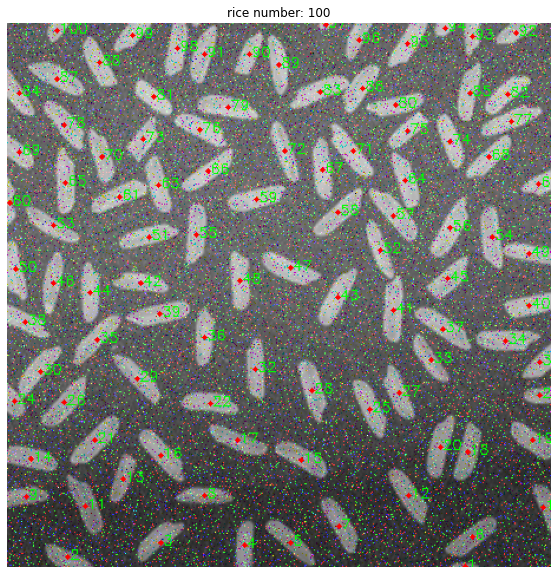

In [38]:
img_path = './data/rice2.png'
rice_count(img_path, 49, 1, 0, 0)

### Ảnh 3: thừa 1

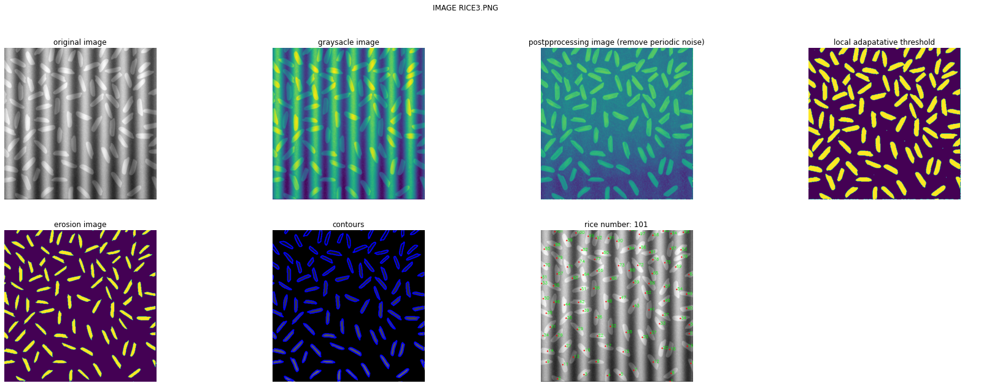

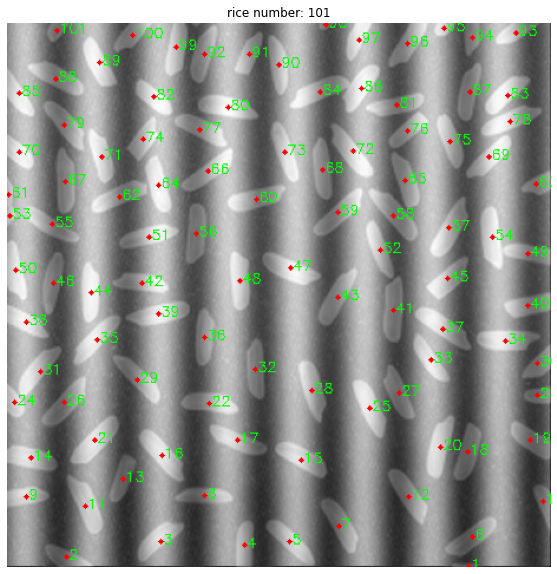

In [39]:
img_path = './data/rice3.png'
rice_count(img_path, 49, 0, 1, 0)

### Ảnh 4: thừa 1

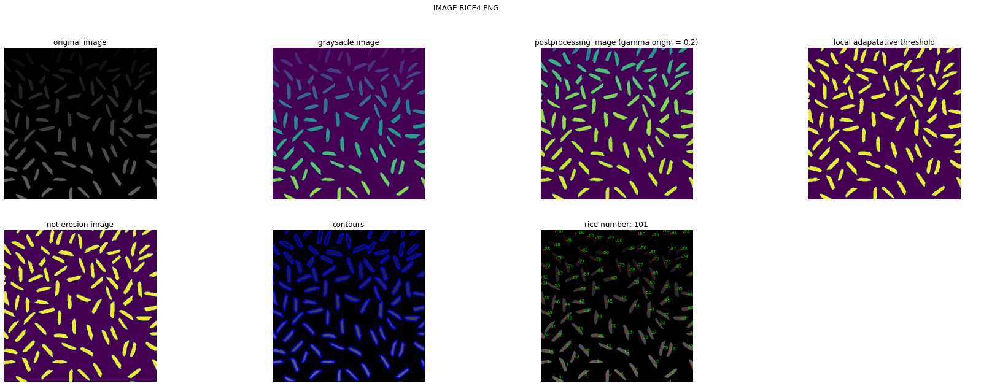

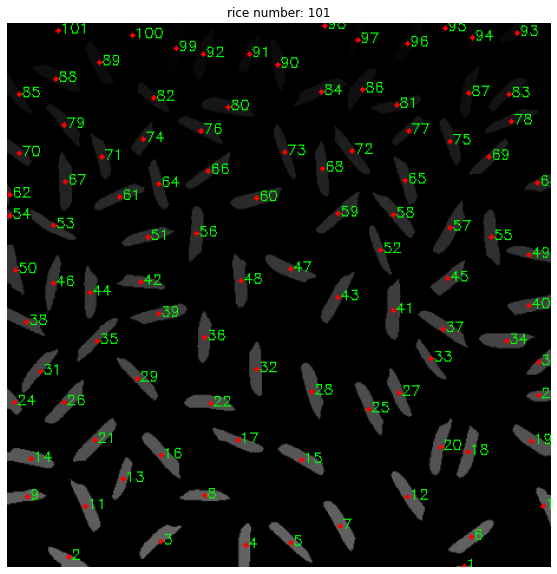

In [40]:
img_path = './data/rice4.png'
rice_count(img_path, 49, 0, 0, 1)

# [**Ảnh đồ vật văn phòng**](https://medium.com/analytics-vidhya/images-processing-segmentation-and-objects-counting-in-an-image-with-python-and-opencv-216cd38aca8e)

## Step by Step

In [41]:
# gray sacle image
def graysacle(img_path):
    og_img = cv2.imread(img_path)
    gray_img = cv2.cvtColor(og_img, cv2.COLOR_BGR2GRAY)

    # print('original image shape: ', og_img.shape)
    # print('graysacle image shape:', img.shape)

    # fig, ax = plt.subplots(1,2, figsize=(15,15)) #1 row, 2 columns
    
    # ax[0].set_title("original image")
    # ax[0].imshow(og_img);

    # ax[1].set_title("graysacle image")
    # ax[1].imshow(img);

    return og_img, gray_img

In [42]:
# contrast adjusting with gamma correction y = 1.2
def contrast_gama(gray_im):
    gray_correct = np.array(255 * (gray_im / 255) ** 1.2 , dtype='uint8')

    # plt.figure(figsize=(10,10))
    # plt.title('gamma correction y= 1.2')
    # plt.imshow(gray_correct)
    
    return gray_correct

In [43]:
# local adaptative threshold
def LA_thresold(gray_correct):
    thresh = cv2.adaptiveThreshold(gray_correct, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 255, 19)
    thresh = cv2.bitwise_not(thresh)

    # plt.figure(figsize=(10,10))
    # plt.title('local adapatative threshold')
    # plt.imshow(thresh)

    return thresh

In [44]:
# dilatation and erosion
def dil_ero(thresh):
    kernel_1 = np.ones((15,15), np.uint8)
    kernel_2= np.ones((13,13), np.uint8)

    img_dilation = cv2.dilate(thresh, kernel_1, iterations=1)

    img_erode = cv2.erode(img_dilation,kernel_2, iterations=1)

    # fig, ax = plt.subplots(1,2, figsize=(15,15)) #1 row, 2 columns
        
    # ax[0].set_title("dilatation image")
    # ax[0].imshow(img_dilation);

    # ax[1].set_title("erosion image")
    # ax[1].imshow(img_erode);

    return img_dilation, img_erode

In [45]:
# clean all noise after dilatation and erosion
def remove_noise(img_erode):
    clean_noise = cv2.medianBlur(img_erode, 7)

    # plt.figure(figsize=(10,10))
    # plt.title('clean all noise after dilatation and erosion')
    # plt.imshow(clean_noise)
    
    return clean_noise

In [46]:
def draw_contour(clean_noise, og_img):
    contours, _ = cv2.findContours(clean_noise, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    output_contour = og_img.copy()
    draw_cont = cv2.drawContours(output_contour, contours, -1, (0, 0, 255), 2)

    # print('Number of detected contours', len(contours))
    # plt.figure(figsize = (10,10))
    # plt.title('contours')
    # plt.imshow(output_contour)

    return contours, draw_cont

In [47]:
# labeling 1
def labeling_1(clean_noise):
    ret, labels = cv2.connectedComponents(clean_noise)
    label_hue = np.uint8(179 * labels / np.max(labels))
    blank_ch = 255 * np.ones_like(label_hue)
    labeled_img = cv2.merge([label_hue, blank_ch, blank_ch])
    labeled_img = cv2.cvtColor(labeled_img, cv2.COLOR_HSV2BGR)
    labeled_img[label_hue == 0] = 0

    # print('objects number is:', ret-1)
    # plt.figure(figsize=(10,10))
    # plt.title('objects counted:'+ str(ret-1))
    # plt.imshow(labeled_img)
    return ret-1, labeled_img

In [48]:
# lableing_2
def labeling_2(og_img, contours):
    label_2 = og_img.copy()
    # select contours with areas > threshold
    contours_ = [cnt for cnt in contours if cv2.contourArea(cnt) > 109] # 109 == min area contour

    for idx, cnt in enumerate(contours_):
        x,y,w,h = cv2.boundingRect(cnt)
        # add a red dot at center contours
        cv2.circle(label_2, (x+int(w/2),y+int(h/2)), radius=0, color=(255, 0, 0), thickness=3)

        # draw rectangle contours
        # cv2.rectangle(og_img, (x, y), (x + w, y + h), (0,0,255), 2)

        # draw contours
        # cv2.drawContours(og_img, contours, -1, (0, 0, 255), 2)
        
        # put index contours
        cv2.putText(label_2, str(idx+1), (x+int(w/2) + 1, y+int(h/2) + 1), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0,255,0),2) 
    
    # plt.figure(figsize = (10,10))
    # plt.title("labeling 2")
    # plt.imshow(label_2)
    # print("Number detected contours", idx+1)

    return idx+1, label_2

## Define function

In [49]:
def office_objects_count(img_path):
    og_img, gray_im = graysacle(img_path)
    gray_correct = contrast_gama(gray_im)
    thresh = LA_thresold(gray_correct)
    img_dilation, img_erode = dil_ero(thresh)
    clean_noise = remove_noise(img_erode)
    contours, draw_cont = draw_contour(clean_noise, og_img)
    b, label_1 = labeling_1(clean_noise)
    c, label_2 = labeling_2(og_img, contours)

    # all photos for each step 
    fig, ax = plt.subplots(2,5, figsize=(30,10)) #2 row, 5 columns
    for a in ax.flat:
        a.axis('off')

    main_tit = "IMAGE " + str(img_path[7:]).upper()
    fig.suptitle(main_tit)
    
    ax[0,0].set_title("original image")
    ax[0,0].imshow(og_img);

    ax[0,1].set_title("graysacle image")
    ax[0,1].imshow(gray_im);

    ax[0,2].set_title("gamma correction y= 1.2")
    ax[0,2].imshow(gray_correct);

    ax[0,3].set_title("local adapatative threshold")
    ax[0,3].imshow(thresh);

    ax[0,4].set_title("dilatation image")
    ax[0,4].imshow(img_dilation);

    ax[1,0].set_title("erode image")
    ax[1,0].imshow(img_erode);

    ax[1,1].set_title("clean noise (median blur)")
    ax[1,1].imshow(clean_noise);

    tit_1 = "detected contours 1: " + str(len(contours))
    ax[1,2].set_title(tit_1)
    ax[1,2].imshow(draw_cont);

    tit_2 = "detected contours 2: " + str(b)
    ax[1,3].set_title(tit_2)
    ax[1,3].imshow(label_1);
    
    tit_3 = "detected objects: " + str(c)
    ax[1,4].set_title(tit_3)
    ax[1,4].imshow(label_2);

    plt.figure(figsize=(10,10))
    plt.axis('off')
    plt.title(tit_3)
    plt.imshow(label_2)

    # contours_area = [cv2.contourArea(cnt) for cnt in contours]
    # print(sorted(contours_area))

## Kết quả

### Ảnh 1

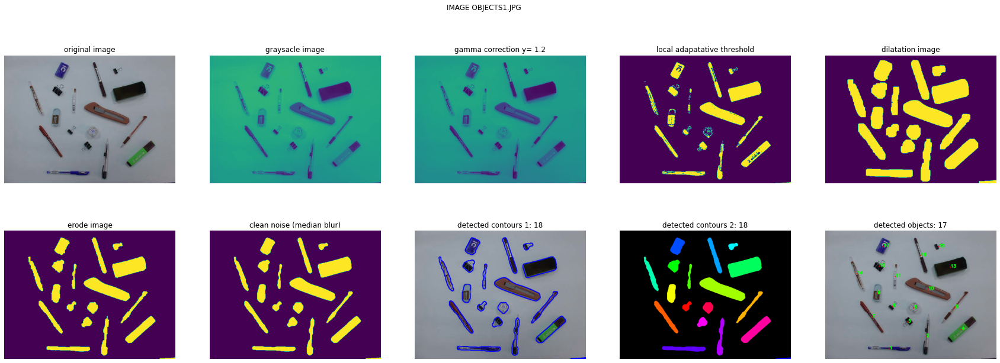

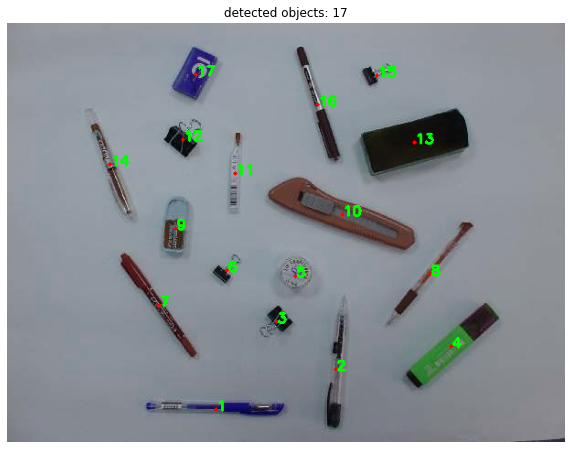

In [50]:
img_path = './data/objects1.jpg'
office_objects_count(img_path)

### Ảnh 2

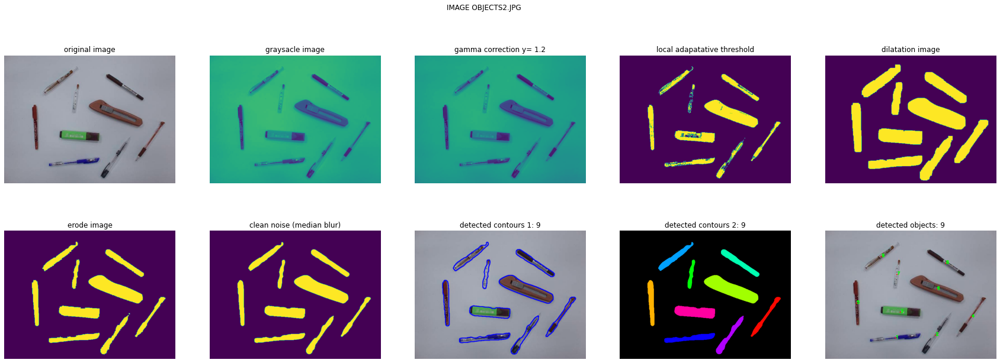

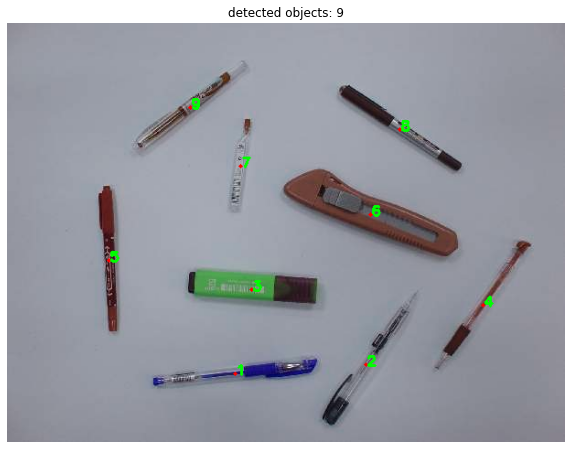

In [51]:
img_path = './data/objects2.jpg'
office_objects_count(img_path)

### Ảnh 3

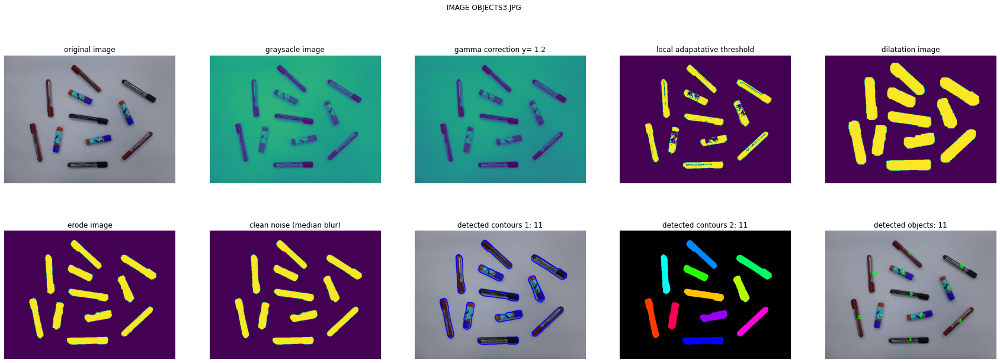

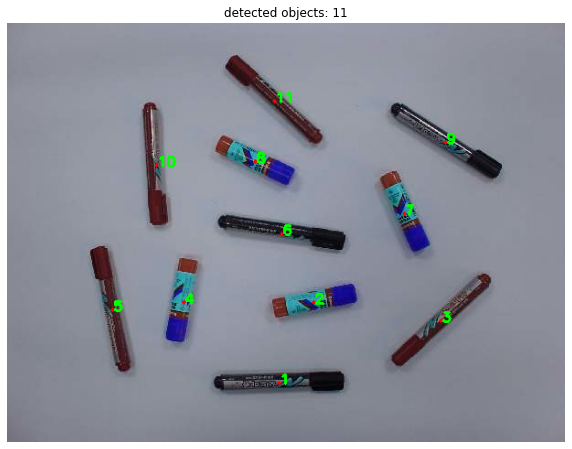

In [52]:
img_path = './data/objects3.jpg'
office_objects_count(img_path)

### Ảnh 4

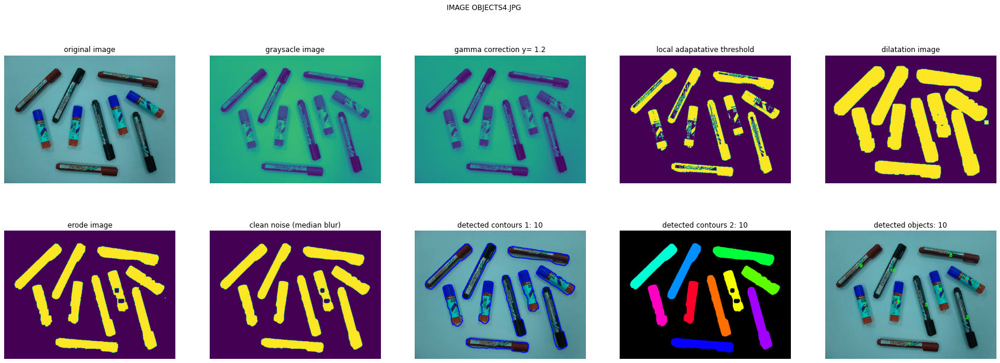

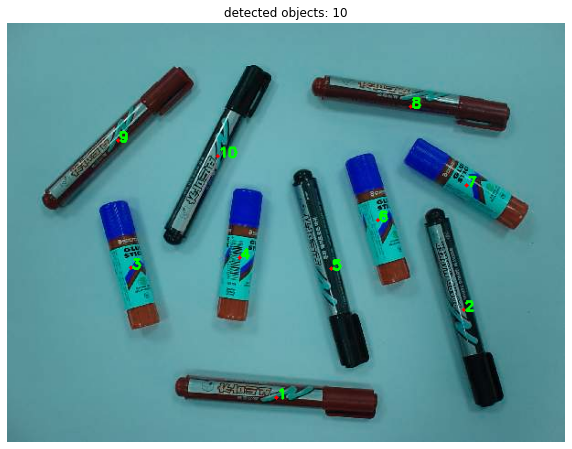

In [53]:
img_path = './data/objects4.jpg'
office_objects_count(img_path)